# 🔎 Assigment 2 in Machine Learning
#### An exploration on Resnet18 and pytorch how different layers works in the CNN(Convolutional Neural Networks) with the help with CAM(Class Attribution Maps) in torchvision & torchcam and how the model classify images.

<small> <i> A report by **Pontus Johansson** <br/>
Course: **Machine Learning** <br/>
**AIM25G** <br/>
2026-04-21</i> </small>

<small>Text have been modified with Copilot to correct spelling and also make the reference list</small>

## 1. Introductions
This report going to explore Convolutions Neural Networks(CNN), that are a type of Neural Network(NN) design to use on images. Why CNN is a better fit for images is because the NN classifying images with detecting patterns as edges, colors, textures, shapes, parts, contours. 

First we going to discuss the choose of CNN model and a short introduction to the model. Then we going to analys how the CNN does it classification. The analysis will explore 3 choosen classes that the CNN is trained on and also one that is non-exisiting, based on ImageNet1k. 
We going to dive depeer in what the models and look on the different layers. With the help of method LayerCAM from torchcam. We going to look at the ealier layer, middle layer and last layer before predicting what class it's.

For this report the main analysis and discussion will be on how good the model predict one the different classes with two positive examples where the object is in the image and two negative examples where the object is not in the image.

## 2. CNN model
In this report we will look at the pre-trained CNN model `ResNet-18`(with default weights) that is the smallest and most lightweight model of the `ResNet` models. The `ResNet-18` have 4 layers.

In [1]:
from processing import ImageProcessor

processor = ImageProcessor()
processor.categories = processor.load_imagenet_json("./src/imagenet_class_index.json")
model = processor.initialize_model("resnet18")
print(model)


(ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
 

In this report we going to analyse 3 different layers. 
- Early layer(``layer1``) - Low‑level features (edges, colors, textures) 
- Middle layer(``layer3``) - Mid‑level features (shapes, parts, contours)
- Late Layer(``layer4``)  - High‑level features (object‑level regions)

## 4. 3 choosen classes and one non-existing class

In this assigment we going to explore three choosen classes to deep dive in how the CNN Resnet18 analyses the images and classifies them. We going to explore 2 images that are postive where the object for the class is present in the image and 2 images where the object is not present in the image and see how the model classifies the images. 
The three classes in Imagenet, that has been choosen is `lesser_panda`, `warplane`, `spaghetti_squash`. This classes can be mixed up and we will see how confident the model is with the classifications.
Lastley we want to check what the model would classify an object that aren't in the traning data for the model and are not even a real thing in the non-existing image.

#### Lesser panda images
For the class `lesser_panda` we going to explore how the model handel the animal as an adult and newborn panda, where we will have "positive" examples where the animal is in the image, but will it classify correctly?. For the "negative" examples we going to explore if the model classify wrongly on animal that are not the same as a Lesser panda.
<div style="display: grid; grid-template-columns: 1fr 1fr; gap: 20px;">
  <div>
    <h3>Lesser Panda "positve" examples</h3>
    <div style="display: flex; flex-direction: row;">
      <img src="./data/lesser_panda_positive1.jpg" style="width:200px;" />&nbsp;
      <img src="./data/lesser_panda_positive2.jpg" style="width:200px;" />&nbsp;
    </div>
  </div>
  <div>
    <h3>Lesser Panda "negative" examples</h3>
    <div style="display: flex; flex-direction: row;">
      <img src="./data/lesser_panda_negative1.jpg" style="width:200px;" />&nbsp;
      <img src="./data/lesser_panda_negative2.jpg" style="width:200px;" />&nbsp;
    </div>
  </div>
</div>

#### Warplane images
For the class `warplane` we going to explore how the model handel the planes, where we will have "positive" examples where the warplane is in the image. For the "negative" examples we going to explore if the model classify wrongly on other planes that are not the same as a warplanes.
<div style="display: grid; grid-template-columns: 1fr 1fr; gap: 20px;">
  <div>
    <h3>Military plane "positve" examples</h3>
    <div style="display: flex; flex-direction: row;">
      <img src="./data/warplane_positive1.jpg" style="width:200px;" />&nbsp;
      <img src="./data/warplane_positive2.jpg" style="width:200px;" />&nbsp;
    </div>
  </div>
  <div>
    <h3>Militray plane "negative" examples</h3>
    <div style="display: flex; flex-direction: row;">
      <img src="./data/warplane_negative1.jpg" style="width:200px;" />&nbsp;
      <img src="./data/warplane_negative2.jpg" style="width:200px;" />&nbsp;
    </div>
  </div>
</div>

#### Spaghetti Squash images
For the class `spaghetti_squash` we going to explore how the model handel the vegetables, where we will have "positive" examples where the vegetable is in the image. For the "negative" examples we going to explore if the model classify wrongly on vegetables that are not the same as a `spaghetti_squash`, could the model think it's a spaghetti squash?.
<div style="display: grid; grid-template-columns: 1fr 1fr; gap: 20px;">
  <div>
    <h3>Spaghetti Squash "positve" examples</h3>
    <div style="display: flex; flex-direction: row;">
      <img src="./data/spaghetti_squash_positive1.jpg" style="width:200px;" />&nbsp;
      <img src="./data/spaghetti_squash_positive2.jpg" style="width:200px;" />&nbsp;
    </div>
  </div>
  <div>
    <h3>Spaghetti Squash "negative" examples</h3>
    <div style="display: flex; flex-direction: row;">
      <img src="./data/spaghetti_squash_negative1.jpg" style="width:200px;" />&nbsp;
      <img src="./data/spaghetti_squash_negative2.jpg" style="width:200px;" />&nbsp;
    </div>
  </div>
</div>

#### Non-existing class
For the `Non-existing` class we going to explore how the model handels a non-existing object. For this example we going to explore an anime character from the series `Reincarnated as a Dragon Hatchling` in one of the charecters first evolution stages. What will the model think it's?.
<div>
  <h3>Non-existing example</h3>
  <div style="display: flex; flex-direction: row;">
    <img src="./data/non_existing.jpg" height="150" />
  </div>
</div>

## Analysis & discussion

We going to begin with focusing on the `lesser_panda`, where we going to see two positive examples showing the same species in different stages(an adult and a newborn). By comparing different stages for the `lesser_panda`, we can try to see how good the pre-trained model handels different images but same species. Will the pre-trained model guess correctly?

In [2]:
import pathlib as Path


DATA_DIR = Path.Path.cwd() / "data"

EXAMPLES = [ {
    "class_name": "lesser_panda",
    "positive1_path": DATA_DIR / "lesser_panda_positive1.jpg",
    "positive2_path": DATA_DIR / "lesser_panda_positive2.jpg",
    "negative1_path": DATA_DIR / "lesser_panda_negative1.jpg",
    "negative2_path": DATA_DIR / "lesser_panda_negative2.jpg"
}, 
{
    "class_name": "warplane",
    "positive1_path": DATA_DIR / "warplane_positive1.jpg",
    "positive2_path": DATA_DIR / "warplane_positive2.jpg",
    "negative1_path": DATA_DIR / "warplane_negative1.jpg",
    "negative2_path": DATA_DIR / "warplane_negative2.jpg"
}
,
{
    "class_name": "spaghetti_squash",
    "positive1_path": DATA_DIR / "spaghetti_squash_positive1.jpg",
    "positive2_path": DATA_DIR / "spaghetti_squash_positive2.jpg",
    "negative1_path": DATA_DIR / "spaghetti_squash_negative1.jpg",
    "negative2_path": DATA_DIR / "spaghetti_squash_negative2.jpg"
}
]

Class:  lesser_panda
Positive Example 1: 


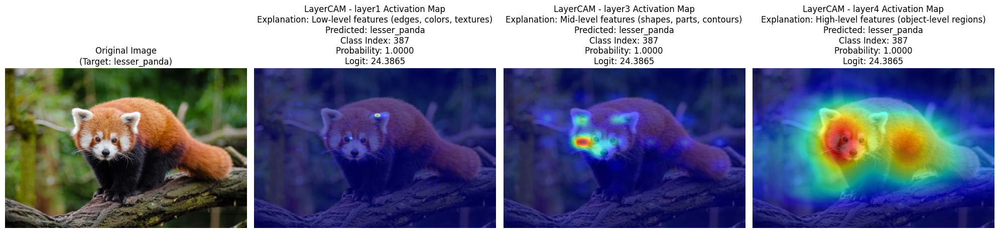

Filename: lesser_panda_positive1.jpg
Target Class: lesser_panda
Predicted Class: lesser_panda
Target Class Rank: 1
Target Class Probability: 1.0000

Top 5 Predictions:
1. lesser_panda (Index: 387, Probability: 1.0000)
2. polecat (Index: 358, Probability: 0.0000)
3. red_fox (Index: 277, Probability: 0.0000)
4. giant_panda (Index: 388, Probability: 0.0000)
5. weasel (Index: 356, Probability: 0.0000)
Positive Example 2: 


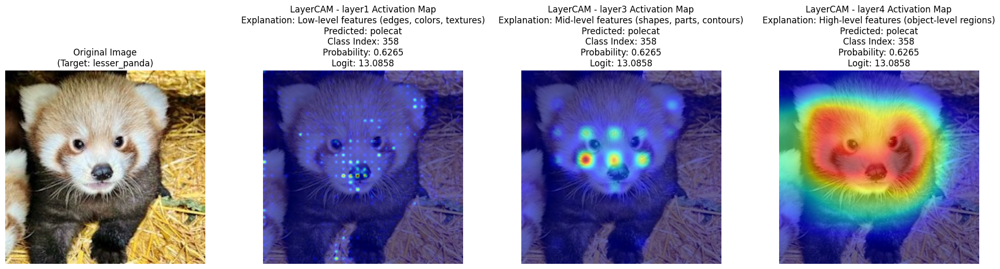

Filename: lesser_panda_positive2.jpg
Target Class: lesser_panda
Predicted Class: polecat
Target Class Rank: 2
Target Class Probability: 0.1357

Top 5 Predictions:
1. polecat (Index: 358, Probability: 0.6265)
2. lesser_panda (Index: 387, Probability: 0.1357)
3. black-footed_ferret (Index: 359, Probability: 0.1000)
4. weasel (Index: 356, Probability: 0.0872)
5. mink (Index: 357, Probability: 0.0147)


In [3]:
for exp in EXAMPLES[0:1]: 
    print("=" * 80)
    print("Class: ", exp["class_name"])
    print("Positive Example 1: ")
    positive1_result = processor.analyse_image_CAM_with_layers(exp["positive1_path"], exp["class_name"])
    processor.display_cam_results(positive1_result) 
    print("=" * 80)
    print("Positive Example 2: ")
    positive2_result = processor.analyse_image_CAM_with_layers(exp["positive2_path"], exp["class_name"])
    processor.display_cam_results(positive2_result)

The ResNet18 model clearly recognizes the adult lesser panda with very high confidence (around 100%), indicating it has seen many similar adult examples during training. For the newborn lesser panda, however, the model fails: it predicts polecat and assigns only about 13.6% probability to ``lesser_panda``. LayerCAMs show that mid‑level layers still search for fur patterns and contours, but the deep layer (layer4) does not form a strong, class‑specific activation for the newborn. Likely causes are that the newborn’s proportions, muted markings and texture differ from the adult prototypes the network learned, and that the training set contained few or no newborn examples. 

In the next two negative examples we going to explore where the species is not in the images. First we will see if it will reconize the `polecat` and the `racoon`.

Class:  lesser_panda
Negative Example 1: 


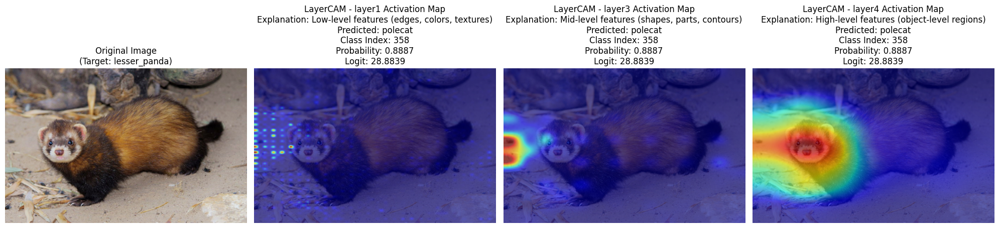

Filename: lesser_panda_negative1.jpg
Target Class: lesser_panda
Predicted Class: polecat
Target Class Rank: 8
Target Class Probability: 0.0000

Top 5 Predictions:
1. polecat (Index: 358, Probability: 0.8887)
2. black-footed_ferret (Index: 359, Probability: 0.1022)
3. weasel (Index: 356, Probability: 0.0088)
4. mink (Index: 357, Probability: 0.0002)
5. badger (Index: 362, Probability: 0.0000)
Negative Example 2: 


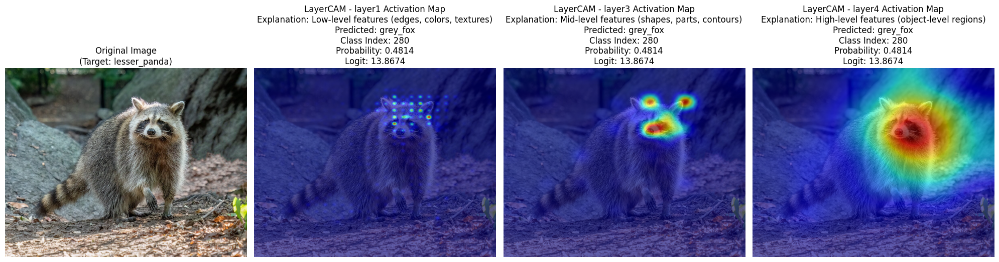

Filename: lesser_panda_negative2.jpg
Target Class: lesser_panda
Predicted Class: grey_fox
Target Class Rank: 21
Target Class Probability: 0.0018

Top 5 Predictions:
1. grey_fox (Index: 280, Probability: 0.4814)
2. kit_fox (Index: 278, Probability: 0.1765)
3. red_fox (Index: 277, Probability: 0.1533)
4. meerkat (Index: 299, Probability: 0.0453)
5. badger (Index: 362, Probability: 0.0298)


In [4]:
for exp in EXAMPLES[0:1]: 
    print("=" * 80)
    print("Class: ", exp["class_name"])
    print("Negative Example 1: ")
    negative1_result = processor.analyse_image_CAM_with_layers(exp["negative1_path"], exp["class_name"])
    processor.display_cam_results(negative1_result) 
    print("=" * 80)
    print("Negative Example 2: ")
    negative2_result = processor.analyse_image_CAM_with_layers(exp["negative2_path"], exp["class_name"])
    processor.display_cam_results(negative2_result)

What we can see in the two negative examples we tested, the network correctly did not label the images as ``lesser_panda``. For the polecat image ResNet18 is highly confident: it predicts ``polecat`` with roughly 88% probability, while ``lesser_panda`` appears far down the ranking (effectively zero probability). This suggests the model has strong, well‑tuned detectors for polecat‑like visual patterns and is able to distinguish those from lesser panda features. For the raccoon image, a species not represented as a distinct class in the ImageNet‑1k set. The model likewise does not select ``lesser_panda`` as the top class; it assigns only a very small probability (≈ 0.18%) to ``lesser_panda`` while preferring other visually similar ImageNet classes. The tiny non‑zero probability indicates the model found a weak visual resemblance to learned prototypes, but not enough evidence to make a confident prediction. Overall, these results show that ResNet18 reliably rejects non‑panda images when strong class evidence is absent, and that confident misclassification is more likely when the input matches a well‑represented class in the training set.


Now we going to analyse ``warplane`` images now. First, we examine two positive examples that contain warplanes to see whether the ResNet18 model can correctly identify the aircraft.

Class:  warplane
Positive Example 1: 


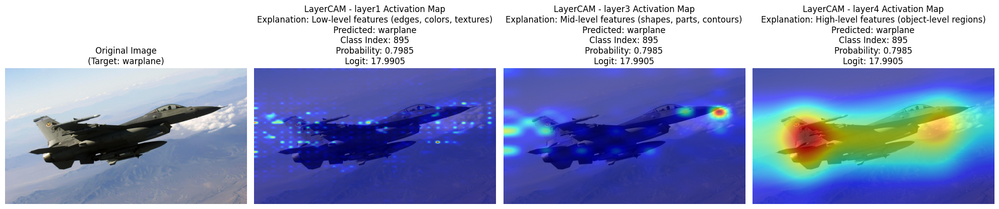

Filename: warplane_positive1.jpg
Target Class: warplane
Predicted Class: warplane
Target Class Rank: 1
Target Class Probability: 0.7985

Top 5 Predictions:
1. warplane (Index: 895, Probability: 0.7985)
2. projectile (Index: 744, Probability: 0.1201)
3. missile (Index: 657, Probability: 0.0687)
4. wing (Index: 908, Probability: 0.0064)
5. aircraft_carrier (Index: 403, Probability: 0.0021)
Positive Example 2: 


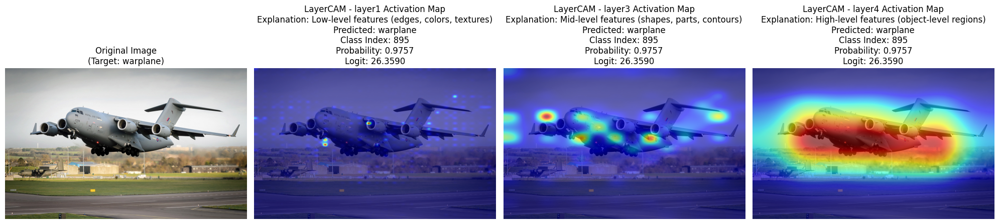

Filename: warplane_positive2.jpg
Target Class: warplane
Predicted Class: warplane
Target Class Rank: 1
Target Class Probability: 0.9757

Top 5 Predictions:
1. warplane (Index: 895, Probability: 0.9757)
2. wing (Index: 908, Probability: 0.0103)
3. airliner (Index: 404, Probability: 0.0067)
4. space_shuttle (Index: 812, Probability: 0.0041)
5. projectile (Index: 744, Probability: 0.0013)


In [5]:
for exp in EXAMPLES[1:2]: 
    print("=" * 80)
    print("Class: ", exp["class_name"])
    print("Positive Example 1: ")
    positive1_result = processor.analyse_image_CAM_with_layers(exp["positive1_path"], exp["class_name"])
    processor.display_cam_results(positive1_result) 
    print("=" * 80)
    print("Positive Example 2: ")
    positive2_result = processor.analyse_image_CAM_with_layers(exp["positive2_path"], exp["class_name"])
    processor.display_cam_results(positive2_result)

The model correctly identifies the warplane in both images with high confidence (around 80% and 98%). LayerCAM shows that the network’s attention depends on the surrounding environment: in the first image the last layer emphasizes the rear of the aircraft, whereas in the second it highlights the lower fuselage. This difference suggests background and viewpoint influence which parts the model uses as evidence.
We could also say that the ResNet18 model has been trained on more images like the last positive images.

In the two negative examples we going to look on images not containing `warplane` but instead a private jet and a helicopter. Since the model is not trained on private jet or helicopter specific, I am intrested to see if the model at least guess airliner.

Class:  warplane
Negative Example 1: 


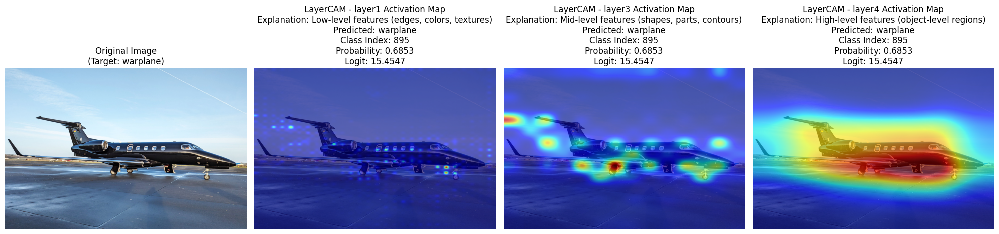

Filename: warplane_negative1.jpg
Target Class: warplane
Predicted Class: warplane
Target Class Rank: 1
Target Class Probability: 0.6853

Top 5 Predictions:
1. warplane (Index: 895, Probability: 0.6853)
2. wing (Index: 908, Probability: 0.2230)
3. aircraft_carrier (Index: 403, Probability: 0.0537)
4. airliner (Index: 404, Probability: 0.0221)
5. space_shuttle (Index: 812, Probability: 0.0032)
Negative Example 2: 


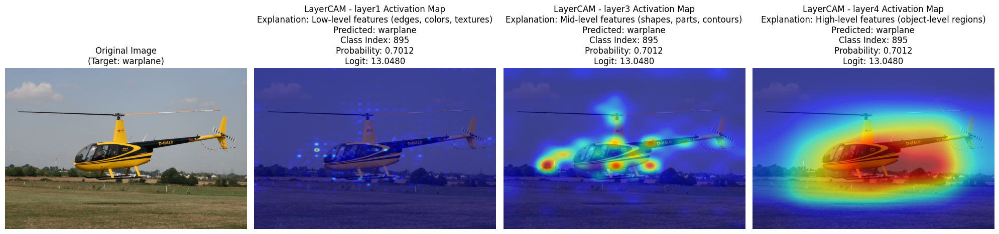

Filename: warplane_negative2.jpg
Target Class: warplane
Predicted Class: warplane
Target Class Rank: 1
Target Class Probability: 0.7012

Top 5 Predictions:
1. warplane (Index: 895, Probability: 0.7012)
2. wing (Index: 908, Probability: 0.1160)
3. airliner (Index: 404, Probability: 0.1130)
4. airship (Index: 405, Probability: 0.0302)
5. parachute (Index: 701, Probability: 0.0046)


In [6]:
for exp in EXAMPLES[1:2]: 
    print("=" * 80)
    print("Class: ", exp["class_name"])
    print("Negative Example 1: ")
    negative1_result = processor.analyse_image_CAM_with_layers(exp["negative1_path"], exp["class_name"])
    processor.display_cam_results(negative1_result) 
    print("=" * 80)
    print("Negative Example 2: ")
    negative2_result = processor.analyse_image_CAM_with_layers(exp["negative2_path"], exp["class_name"])
    processor.display_cam_results(negative2_result)

In the negative examples the model incorrectly predicts warplane with relatively high confidence (around 68–70%). This suggests the network finds strong local cues that resemble aircraft features even though the images are not true warplanes, which in turn implies the training set did not include similar negative examples. LayerCAMs show the deepest activations concentrated on the lower fuselage region in both images, indicating the model relied on that subpart as decisive evidence. 

In the next examples we will check on `spaghetti_squash` and we will start with positive images where the `spaghetti_squash` is in the images.

Class:  spaghetti_squash
Positive Example 1: 


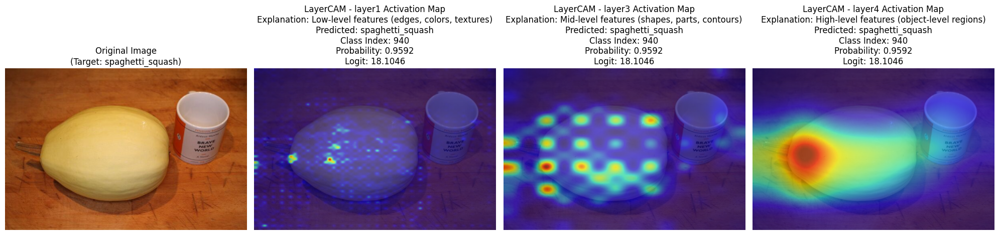

Filename: spaghetti_squash_positive1.jpg
Target Class: spaghetti_squash
Predicted Class: spaghetti_squash
Target Class Rank: 1
Target Class Probability: 0.9592

Top 5 Predictions:
1. spaghetti_squash (Index: 940, Probability: 0.9592)
2. butternut_squash (Index: 942, Probability: 0.0382)
3. acorn_squash (Index: 941, Probability: 0.0011)
4. mortar (Index: 666, Probability: 0.0002)
5. dough (Index: 961, Probability: 0.0001)
Positive Example 2: 


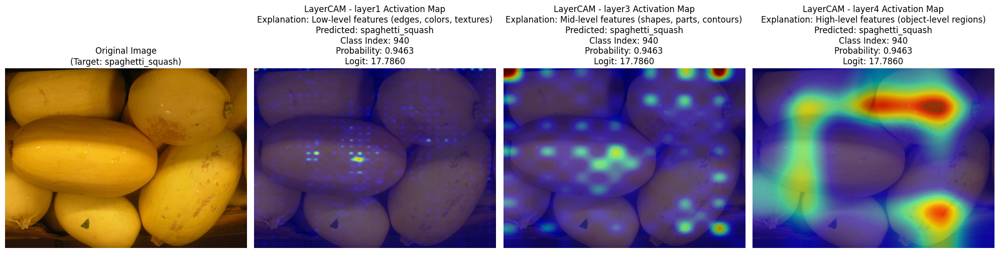

Filename: spaghetti_squash_positive2.jpg
Target Class: spaghetti_squash
Predicted Class: spaghetti_squash
Target Class Rank: 1
Target Class Probability: 0.9463

Top 5 Predictions:
1. spaghetti_squash (Index: 940, Probability: 0.9463)
2. butternut_squash (Index: 942, Probability: 0.0410)
3. banana (Index: 954, Probability: 0.0054)
4. lemon (Index: 951, Probability: 0.0041)
5. acorn_squash (Index: 941, Probability: 0.0013)


In [7]:
for exp in EXAMPLES[2:3]: 
    print("=" * 80)
    print("Class: ", exp["class_name"])
    print("Positive Example 1: ")
    positive1_result = processor.analyse_image_CAM_with_layers(exp["positive1_path"], exp["class_name"])
    processor.display_cam_results(positive1_result) 
    print("=" * 80)
    print("Positive Example 2: ")
    positive2_result = processor.analyse_image_CAM_with_layers(exp["positive2_path"], exp["class_name"])
    processor.display_cam_results(positive2_result)

For both positive examples the model shows very high confidence in the ``spaghetti_squash`` label (around 94–96%). LayerCAM overlays indicate that in the first image the deepest layer strongly highlights the squash’s rind texture and the stem, implying the model uses these local, class‑specific features as primary evidence.
In the second image the model again emphasizes texture and pattern, but it struggles to focus on a single squash, activations are more distributed.

The model also assigns tiny probabilities to other classes. On the first images it's about 0.01% for `dough`, I think its because of a lighter hue/color. On the second image it was about 0.4–0.5% for banana/lemon—which points to a deeper yellow color.

Next two negative examples we going to explore if the model could reconize a yellow `zucchini` or a yellow melon or will the model think its a `spaghetti_squash`. 

Class:  spaghetti_squash
Negative Example 1: 


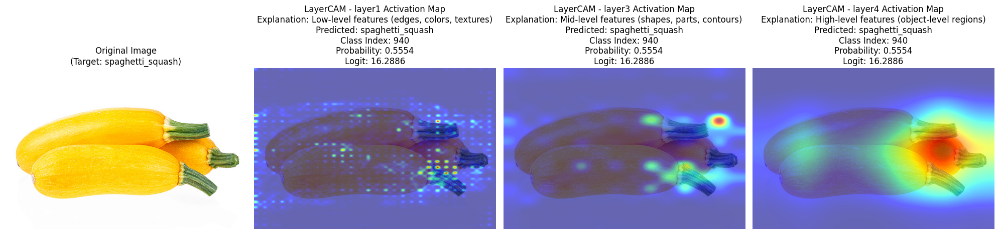

Filename: spaghetti_squash_negative1.jpg
Target Class: spaghetti_squash
Predicted Class: spaghetti_squash
Target Class Rank: 1
Target Class Probability: 0.5554

Top 5 Predictions:
1. spaghetti_squash (Index: 940, Probability: 0.5554)
2. zucchini (Index: 939, Probability: 0.1533)
3. lemon (Index: 951, Probability: 0.1219)
4. acorn_squash (Index: 941, Probability: 0.0630)
5. bell_pepper (Index: 945, Probability: 0.0463)
Negative Example 2: 


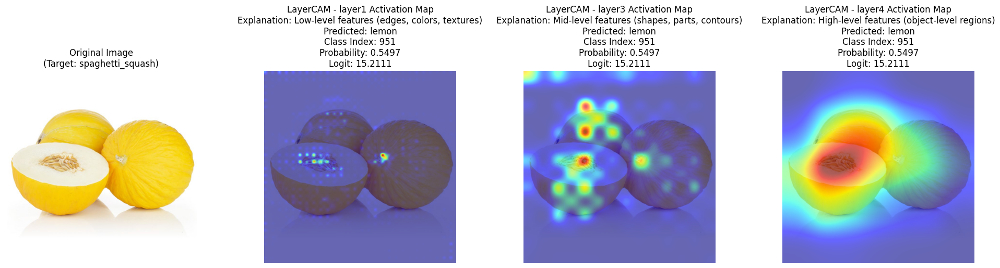

Filename: spaghetti_squash_negative2.jpg
Target Class: spaghetti_squash
Predicted Class: lemon
Target Class Rank: 2
Target Class Probability: 0.4213

Top 5 Predictions:
1. lemon (Index: 951, Probability: 0.5497)
2. spaghetti_squash (Index: 940, Probability: 0.4213)
3. orange (Index: 950, Probability: 0.0128)
4. acorn_squash (Index: 941, Probability: 0.0082)
5. banana (Index: 954, Probability: 0.0016)


In [8]:
for exp in EXAMPLES[2:3]: 
    print("=" * 80)
    print("Class: ", exp["class_name"])
    print("Negative Example 1: ")
    negative1_result = processor.analyse_image_CAM_with_layers(exp["negative1_path"], exp["class_name"])
    processor.display_cam_results(negative1_result) 
    print("=" * 80)
    print("Negative Example 2: ")
    negative2_result = processor.analyse_image_CAM_with_layers(exp["negative2_path"], exp["class_name"])
    processor.display_cam_results(negative2_result)

In the first image the model predicted`` spaghetti_squash`` with roughly 56% probability and zucchini with about 15%. LayerCAM shows strong activation on the rind texture and the stem, suggesting the model recognized textural cues but was biased by the yellow color and stem shape toward ``spaghetti_squash``, likely because it has seen similar colored examples during training. But its good that it did reconize the zucchini.

In the second image the model predicted ``lemon`` at around 55% and ``spaghetti_squash`` at about 42%. The network’s attention highlights the stem, seeds and exposed flesh, so the bright color and visible interior likely produced a stronger resemblance to citrus classes than to the squash prototype the model learned.

For the final example we going to look at a image that the model has not been trained on, to see what it will think it's. 

Class: Non-Existing
Non-Existing Example: 


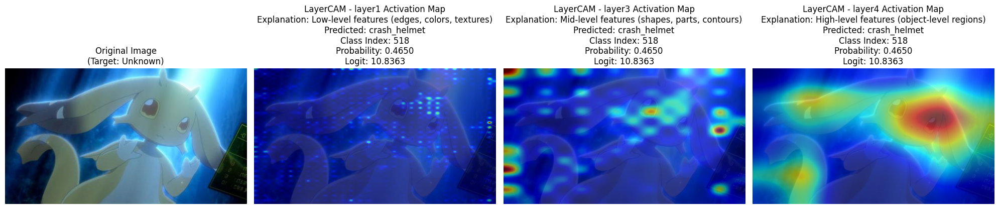

Filename: non_existing.jpg
Target Class: crash_helmet
Predicted Class: crash_helmet
Target Class Rank: 1
Target Class Probability: 0.4650

Top 5 Predictions:
1. crash_helmet (Index: 518, Probability: 0.4650)
2. mouse (Index: 673, Probability: 0.1342)
3. iron (Index: 606, Probability: 0.0561)
4. joystick (Index: 613, Probability: 0.0381)
5. dial_telephone (Index: 528, Probability: 0.0227)


In [9]:
UNKOWN_IMAGE = DATA_DIR / "non_existing.jpg"
print("=" * 80)
print("Class: Non-Existing")
print("Non-Existing Example: ")
unknown_result = processor.analyse_UNKNOWN_image_CAM_with_layers(UNKOWN_IMAGE)
processor.display_cam_results_UNKNOWN(unknown_result)

It is interesting that the model predicts ``crash_helmet`` for this cartoon image. The illustration lacks real texture and detailed shape cues, so the network appears to latch onto the two eye‑like holes and interprets them as a flat, helmet‑like region rather than an animal face. The secondary prediction mouse (≈13%) and what I found it was a computer mouse class and given the absence of organic texture and the simplified, object‑like shapes, the model likely favors an object‑prototype (a computer mouse) over a living animal. In short, the cartoon’s stylized shapes and missing texture push the model to match the input to familiar object prototypes rather than to an animal class.

## Conclusion 
Across the images, the ResNet18 model behaves predictably: it relies on low‑level cues like edges and texture in the early layers, assembles those into parts in the middle layers, and only when those parts match learned prototypes does the deepest layer produce a strong, object‑level signal. When an image closely resembles training examples (for example, clear adult animals like the lesser panda or full‑view aircraft such as warplanes), the model is confident and the deep LayerCAMs concentrate on meaningful regions. Inputs deviate in cases such as newborns with muted markings, partial or unusual viewpoints, stylized cartoons, or species not well represented in the training data; then the deep activations become diffuse or latch onto spurious local cues, and the model’s confidence drops or it confidently chooses the nearest prototype.

These patterns point to two practical conclusions. First, most errors are not random: they reflect prototype mismatch and dataset bias, so targeted data collection (more newborns/stages, varied angles, and different hues/colors) should help. Second, the model needs additional, task‑specific training data, if you plan to use this model for a particular project, provide more representative examples so accuracy improves.

### Reference
- Lecture / course material (unpublished).
- Supervision session / personal communication with Mikael (unpublished).
- Waikato Deep Learning User Guide — Class maps: IMAGENET (web page). https://deeplearning.cms.waikato.ac.nz/user-guide/class-maps/IMAGENET/
- Hands‑On Machine Learning with Scikit‑Learn and PyTorch (book listing).  https://bookhero.se/p/kurslitteratur/teknik-industri-it-1/hands-on-machine-learning-with-scikit-learn-and-pytorch-haftad-eng?gad_source=1&gad_campaignid=21383839361&gbraid=0AAAAA9T_UM1WPm0dUDfVTGd4nKwGXS8sw&gclid=Cj0KCQiAgP_JBhD-ARIsANpEMxyvRttgYiZFeXy0z9Kax3DDJ9U49OM3zmdZVsvztDLmad_7MNx8fhoaAhQ-EALw_wcB

### Image reference
- **BBC News** — *Image* (photograph). Retrieved 6 April  2026: [https://c.files.bbci.co.uk/1598B/production/_131095488_1158da30-5fc4-44fd-9494-c44de2f62640.jpg](https://c.files.bbci.co.uk/1598B/production/_131095488_1158da30-5fc4-44fd-9494-c44de2f62640.jpg)  
- **Animalia.bio** — *Red panda photograph* (photograph). Retrieved 6 April 2026: [https://s3.animalia.bio/animals/photos/full/original/red-panda-25193861686jpg.webp](https://s3.animalia.bio/animals/photos/full/original/red-panda-25193861686jpg.webp)  
- **Wikimedia Commons** — *Raccoon in Central Park* (photograph). Retrieved 6 April 2026: [https://upload.wikimedia.org/wikipedia/commons/thumb/3/3e/Raccoon_in_Central_Park_(35264).jpg/1280px-Raccoon_in_Central_Park_(35264).jpg](https://upload.wikimedia.org/wikipedia/commons/thumb/3/3e/Raccoon_in_Central_Park_(35264).jpg/1280px-Raccoon_in_Central_Park_(35264).jpg)  
- **Animal Diversity Web (David Blank)** — *Contributor image* (photograph). Retrieved 6 April 2026: [https://animaldiversity.org/collections/contributors/david_blank/M_eversmanni2/medium.jpg](https://animaldiversity.org/collections/contributors/david_blank/M_eversmanni2/medium.jpg)  
- **Imgur** — *Image* (PNG). Retrieved 6 April 2026: [https://i.imgur.com/PGqKy4R.png](https://i.imgur.com/PGqKy4R.png)  
- **Shutterstock** — *Three yellow zucchini isolated on white* (stock image). Retrieved 6 April 2026: [http://shutterstock.7eer.net/c/77643/108110/1305?u=https%3A%2F%2Fwww.shutterstock.com%2Fimage-photo%2Fthree-yellow-zucchini-isolated-on-white-1521452327&subId1=/three-yellow-zucchini-isolated-on-white-1521452327](http://shutterstock.7eer.net/c/77643/108110/1305?u=https%3A%2F%2Fwww.shutterstock.com%2Fimage-photo%2Fthree-yellow-zucchini-isolated-on-white-1521452327&subId1=/three-yellow-zucchini-isolated-on-white-1521452327)  
- **Shutterstock** — *Ripe fresh honeydew melon whole slices* (stock image). Retrieved 6 April 2026: [http://shutterstock.7eer.net/c/77643/108110/1305?u=https%3A%2F%2Fwww.shutterstock.com%2Fimage-vector%2Fripe-fresh-honeydew-melon-whole-slices-2312004635&subId1=/ripe-fresh-honeydew-melon-whole-slices-2312004635](http://shutterstock.7eer.net/c/77643/108110/1305?u=https%3A%2F%2Fwww.shutterstock.com%2Fimage-vector%2Fripe-fresh-honeydew-melon-whole-slices-2312004635&subId1=/ripe-fresh-honeydew-melon-whole-slices-2312004635)  
- **Flickr** — *Photograph* (user photo). Retrieved 6 April 2026: [http://www.flickr.com/photos/51004712@N08/5111479737](http://www.flickr.com/photos/51004712@N08/5111479737)  
- **Wikimedia Commons** — *C-17 Transport Aircraft Taking Off from RAF Brize Norton* (photograph). Retrieved 6 April 2026: [https://upload.wikimedia.org/wikipedia/commons/thumb/d/d2/C17_Transport_Aircraft_Taking_Off_from_RAF_Brize_Norton_MOD_45156519.jpg/206px-C17_Transport_Aircraft_Taking_Off_from_RAF_Brize_Norton_MOD_45156519.jpg](https://upload.wikimedia.org/wikipedia/commons/thumb/d/d2/C17_Transport_Aircraft_Taking_Off_from_RAF_Brize_Norton_MOD_45156519.jpg/206px-C17_Transport_Aircraft_Taking_Off_from_RAF_Brize_Norton_MOD_45156519.jpg)  
- **WallpaperTag** — *Aircraft wallpaper* (image). Retrieved 6 April 2026: [https://wallpapertag.com/wallpaper/full/4/c/0/640501-widescreen-high-resolution-aircraft-wallpapers-1920x1080-xiaomi.jpg](https://wallpapertag.com/wallpaper/full/4/c/0/640501-widescreen-high-resolution-aircraft-wallpapers-1920x1080-xiaomi.jpg)  
- **NetEase (image cache)** — *Photograph* (image). Retrieved 6 April 2026: [http://img3.cache.netease.com/photo/0001/2016-04-28/BLNV87575MC30001.jpg](http://img3.cache.netease.com/photo/0001/2016-04-28/BLNV87575MC30001.jpg)  
- **Shutterstock** — *Capture emotion global connection unique snapshot* (stock image). Retrieved 6 April 2026: [http://shutterstock.7eer.net/c/77643/108110/1305?u=https%3A%2F%2Fwww.shutterstock.com%2Fimage-photo%2Fcapture-emotion-global-connection-unique-snapshot-2407964317&subId1=/capture-emotion-global-connection-unique-snapshot-2407964317](http://shutterstock.7eer.net/c/77643/108110/1305?u=https%3A%2F%2Fwww.shutterstock.com%2Fimage-photo%2Fcapture-emotion-global-connection-unique-snapshot-2407964317&subId1=/capture-emotion-global-connection-unique-snapshot-2407964317)  
- **Cookipedia** — *Spaghetti squash* (image). Retrieved 6 April 2026: [https://www.cookipedia.co.uk/wiki/images/thumb/b/b6/Spaghetti_squash.jpg/300px-Spaghetti_squash.jpg](https://www.cookipedia.co.uk/wiki/images/thumb/b/b6/Spaghetti_squash.jpg/300px-Spaghetti_squash.jpg)